<a href="https://colab.research.google.com/github/kellyshreeve/farm-vs-solar-image-classifier/blob/main/Farm%2C_Solar%2C_Lake%2C_Neighborhood_Image_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Farm vs. Solar Field Image Classifier**

### 1. Install Packages

In [1]:
!pip install -Uqq fastai duckduckgo_search
!pip install nbdev fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.1/66.1 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 51.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 75.5 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of multiprocess to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 19.5 MB/s eta 0:00:00


In [12]:
from duckduckgo_search import DDGS
from fastbook import search_images_ddg
# from fastbook import *

from fastcore.all import *
from fastdownload import download_url
from fastai.vision.all import *
from fastai.vision.widgets import *

from time import sleep

### 2. Get Images

In [15]:
def search_images(term, max_images=30):
  '''Take a search term and number of images and return
  a list of image urls of length max_images.

  term: search term for internet image search
  max_images: total images urls to return.'''
  print(f"Searching for images of '{term}'")
  with DDGS() as ddgs:
        images_gen = ddgs.images(
            keywords=term,
            max_results=max_images
        )
        return L(images_gen).itemgot('image')
  # return search_images_ddg(term, max_images=max_images)

Searching for images of 'farm field aerial'


<ipython-input-15-7f59ff931023>:8: UserWarning: DDGS running in an async loop. This may cause errors. Use AsyncDDGS instead.
  with DDGS() as ddgs:


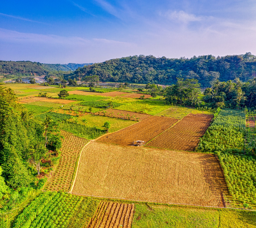

In [16]:
# Download a single image of a farm
urls = search_images('farm field aerial', 1)

# Save to farm.jpg
dest = 'farm.jpg'
download_url(urls[0], dest, show_progress=False)

# Open image thumbnail
im = Image.open(dest)
im.to_thumb(256, 256)

Searching for images of 'solar field aerial'


<ipython-input-15-7f59ff931023>:8: UserWarning: DDGS running in an async loop. This may cause errors. Use AsyncDDGS instead.
  with DDGS() as ddgs:


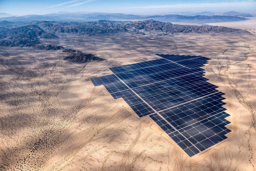

In [17]:
# Download a single image of a solar field
download_url(search_images('solar field aerial', 1)[0], 'solar field.jpg', show_progress=False)

# Open image thumbnail
Image.open('solar field.jpg').to_thumb(256, 256)


In [18]:
# Search varying images in sun and shade
# Save to farm and solar directories
search_terms = 'farm field', 'solar field', 'lake', 'neighborhood'
path = Path('land_use_images')

for o in search_terms:
  dest = (path/o)
  dest.mkdir(exist_ok=True, parents=True)
  download_images(dest, urls=search_images(f'{o} aerial photo', max_images=60))
  sleep(10)
  download_images(dest, urls=search_images(f'{o} aerial sun photo', max_images=60))
  sleep(10)
  download_images(dest, urls=search_images(f'{o} aerial shade photo', max_images=60))
  sleep(10)
  resize_images(path/o, max_size=400, dest=path/o)

Searching for images of 'farm field aerial photo'


<ipython-input-15-7f59ff931023>:8: UserWarning: DDGS running in an async loop. This may cause errors. Use AsyncDDGS instead.
  with DDGS() as ddgs:


Searching for images of 'farm field aerial sun photo'
Searching for images of 'farm field aerial shade photo'
Searching for images of 'solar field aerial photo'
Searching for images of 'solar field aerial sun photo'
Searching for images of 'solar field aerial shade photo'
Searching for images of 'lake aerial photo'
Searching for images of 'lake aerial sun photo'
Searching for images of 'lake aerial shade photo'
Searching for images of 'neighborhood aerial photo'
Searching for images of 'neighborhood aerial sun photo'
Searching for images of 'neighborhood aerial shade photo'


### 3. Train Model

In [19]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)

len(failed)

15

In [20]:
# Create data block of images and labels
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=.2, seed=123),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(128, min_scale=0.5),
    batch_tfms=aug_transforms()
).dataloaders(path, bs=32)

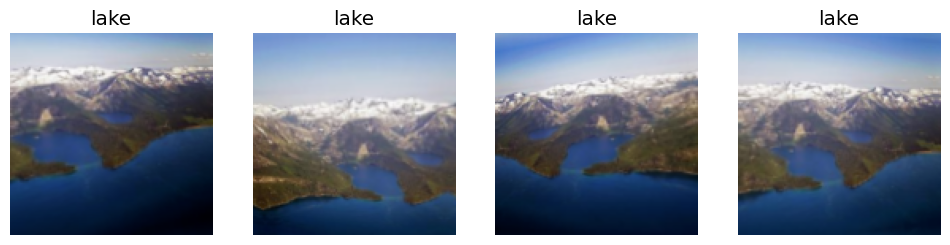

In [21]:
dls.train.show_batch(max_n=4, nrows=1, unique=True)

In [22]:
# Fine tune resnet18 for 3 epochs
neural_net = vision_learner(dls, resnet18, metrics=error_rate)
neural_net.fine_tune(5)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 181MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.760641,0.552257,0.196721,00:02


epoch,train_loss,valid_loss,error_rate,time
0,0.692282,0.452778,0.180328,00:01
1,0.557538,0.431109,0.155738,00:01
2,0.442086,0.409649,0.147541,00:01
3,0.332790,0.369736,0.139344,00:01
4,0.277599,0.353680,0.139344,00:01


### 4. Clean Data

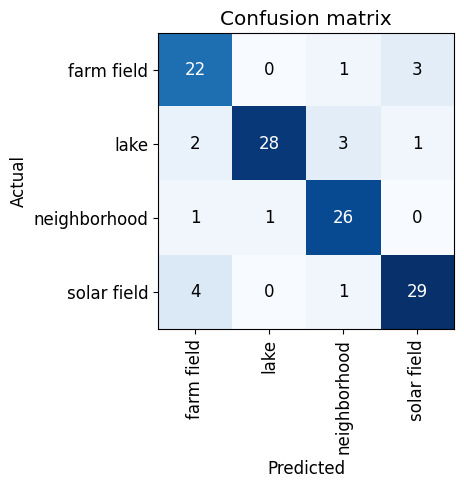

In [23]:
interp = ClassificationInterpretation.from_learner(neural_net)
interp.plot_confusion_matrix()

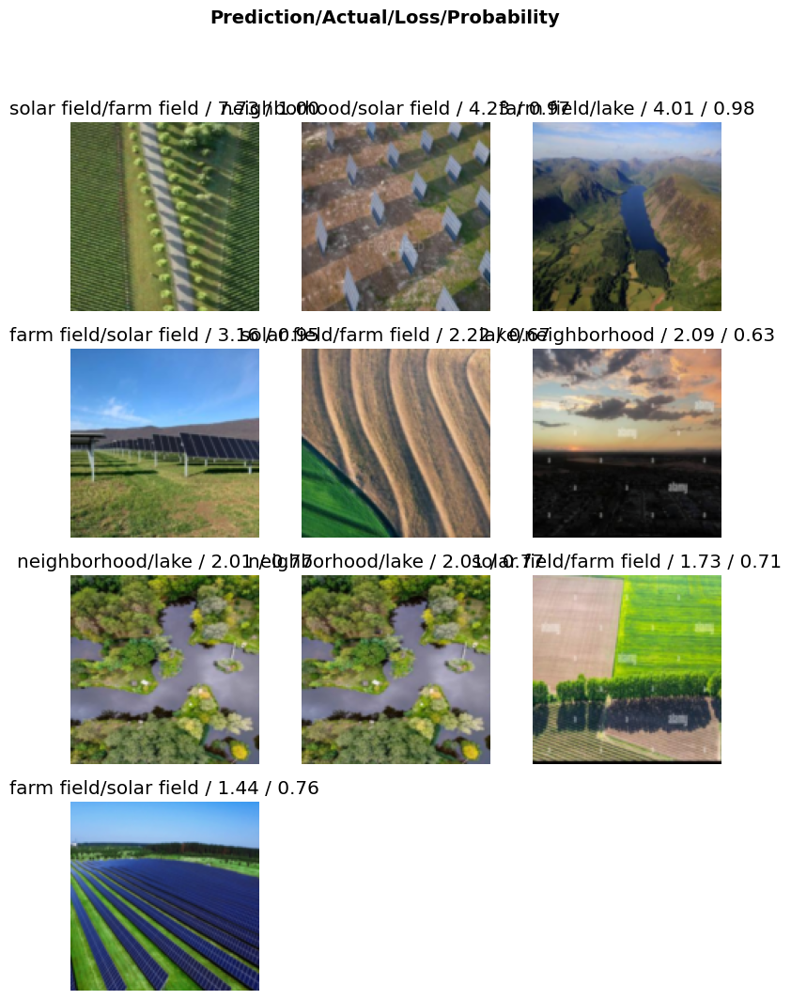

In [24]:
interp.plot_top_losses(k=10, nrows=4)

In [25]:
cleaner = ImageClassifierCleaner(neural_net, max_n=30)
cleaner

In [29]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

### 5. Re-Train on Cleaned Data

In [30]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=.2, seed=123),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(128, min_scale=0.5),
    batch_tfms=aug_transforms()
).dataloaders(path, bs=32)

In [31]:
neural_net = vision_learner(dls, resnet18, metrics=error_rate)
neural_net.fine_tune(9)

epoch,train_loss,valid_loss,error_rate,time
0,1.727855,0.375666,0.125000,00:01


epoch,train_loss,valid_loss,error_rate,time
0,0.669657,0.221038,0.058333,00:01
1,0.550624,0.155665,0.025000,00:01
2,0.459146,0.166385,0.050000,00:01
3,0.378266,0.146015,0.041667,00:01
4,0.294924,0.148883,0.025000,00:01
5,0.229276,0.148958,0.041667,00:01
6,0.199583,0.128834,0.033333,00:01
7,0.169918,0.123466,0.033333,00:01
8,0.150394,0.130394,0.033333,00:01


### 6. Test Model

In [33]:
print(neural_net.predict('farm.jpg'))

neural_net.dls.vocab

('farm field', tensor(0), tensor([1.0000e+00, 5.4848e-08, 8.9407e-08, 3.3380e-06]))


['farm field', 'lake', 'neighborhood', 'solar field']

Test Image


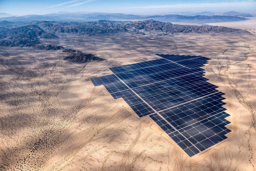


Model Prediction:

This is a: solar field.
Probability it's a solar field: 1.0000


In [35]:
# Predict test solar image
category,idx,proba = neural_net.predict(PILImage.create('solar field.jpg'))

print('Test Image')
display(Image.open('solar field.jpg').to_thumb(256, 256))
print()

print('Model Prediction:')
print()
print(f"This is a: {category}.")
print(f"Probability it's a {category}: {proba[idx]:.4f}")

Test Image


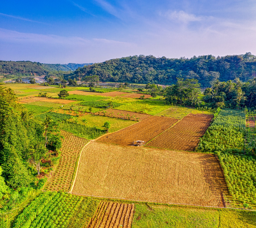


Model Prediction:

This is a: farm field.
Probability it's a farm field: 1.0000


In [37]:
# Predict test farm image
category,idx,proba = neural_net.predict(PILImage.create('farm.jpg'))

print('Test Image')
display(Image.open('farm.jpg').to_thumb(256, 256))
print()

print('Model Prediction:')
print()
print(f"This is a: {category}.")
print(f"Probability it's a {category}: {proba[idx]:.4f}")

### 7. Export Model

In [38]:
neural_net.export()

In [39]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]